# Time Series Clustering - Analysis

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
from specify import *

import time
import os 
os.chdir(os.getcwd())
import sys
# insert at 1, 0 is the script path (or '' in REPL)
pydice_folder = os.path.dirname(os.getcwd())+"\\1_Model"
policy_folder = os.path.dirname(os.getcwd())+"\\5_Policy_Discovery"
sys.path.insert(1, pydice_folder)
#font and color codes
import changefont as cf
clr_palette = ([sns.color_palette("inferno", 15)[-3],sns.color_palette("viridis", 10)[-4],
                sns.color_palette("viridis", 10)[3],sns.cubehelix_palette(10)[5]])

import time
import itertools

from SALib.analyze import sobol

from specify import specify_levers
from ema_workbench import (save_results, load_results)

from ema_workbench.em_framework.evaluators import perform_experiments, LHS, SOBOL, MORRIS, MC
from ema_workbench.em_framework.samplers import sample_uncertainties
from ema_workbench.analysis import parcoords
from ema_workbench.analysis import clusterer, plotting, Density
from ema_workbench.util import ema_logging
from ema_workbench import (perform_experiments, Model, Policy, Scenario, ReplicatorModel, RealParameter, IntegerParameter, ScalarOutcome, ArrayOutcome, 
                           Constant, ema_logging, SequentialEvaluator, MultiprocessingEvaluator)

ema_logging.log_to_stderr(ema_logging.INFO)

from PyDICE_V4 import PyDICE

C:\Users\Shajee\Anaconda3\lib\site-packages\ema_workbench\analysis\prim.py:31: ImportWarning: altair based interactive inspection not available
  "inspection not available"), ImportWarning)
C:\Users\Shajee\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
C:\Users\Shajee\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and __path__
  return f(*args, **kwds)
C:\Users\Shajee\Anaconda3\lib\site-packages\sklearn\ensemble\weight_boosting.py:29: DeprecationWarning: numpy.core.umath_tests is an internal NumPy module and should not be imported. It will be removed in a future NumPy release.
  from numpy.core.umath_tests import inner1d
C:\Users\Shajee\Anaconda3\lib\importlib\_bootstrap.py:219: ImportWarning: can't resolve package from __spec__ or __package__, falling back on __name__ and _

In [2]:
n_scenarios=30000

In [3]:
file_name = 'exploration_V4_' + str(n_scenarios) + 'scen_' + 'nordhaus_optimal_policy_' + str(4) + 'obj' + '.tar.gz'
#save_results(results, file_name)
results = load_results(file_name)

[MainProcess/INFO] results loaded succesfully from C:\Users\Shajee\Documents\GitHub\PyDICE\4_Scenario_Discovery\exploration_V4_30000scen_nordhaus_optimal_policy_4obj.tar.gz


In [4]:
experiments, outcomes = results

In [5]:
noutcomes = {}
for i in range(int(len(outcomes.keys())/5)):
    arr = np.stack((outcomes[x] for x in list(outcomes.keys())[i::4]), axis=-1)
    key = list(outcomes.keys())[i][:-5]
    noutcomes[key] = arr
noutcomes_wo_time = noutcomes.copy()

In [6]:
TimeLine = [2010,2050,2100,2150,2200,2300]
noutcomes["TIME"] = np.array([TimeLine,TimeLine])

## Calcualte shilhouettes for determining the number of cluster for each outcome of interest

In [7]:
scoresDF = pd.DataFrame()
for i in range(len(list(noutcomes.keys()))-1): 
    dataDF = pd.read_csv(list(noutcomes.keys())[i] + '_cluster_silhouette_width.txt', sep=" ", header=None)
    dataDF.columns = [list(noutcomes.keys())[i]]
    scoresDF = scoresDF.append(dataDF.T,sort=True)
scoresDF = scoresDF.T

In [8]:
cluster_no = [x+2 for x in scoresDF.index.to_list()]

In [9]:
scoresDF.insert(loc=0, column="no. of cluster", value=cluster_no)

In [10]:
scoresDF

,no. of cluster,Atmospheric Temperature,Damages,Utility,Total Output
0,2,0.710725,0.590611,0.974855,0.988719
1,3,0.536434,0.456236,0.932970,0.961915
2,4,0.496347,0.596514,0.925535,0.881707
3,5,0.399000,0.583195,0.788417,0.859294
4,6,0.394904,0.587229,0.788142,0.859390
5,7,0.402239,0.479440,0.788123,0.858999
6,8,0.384199,0.478606,0.728144,0.853956
7,9,0.381790,0.475056,0.727953,0.832657
8,10,0.381719,0.477996,0.541316,0.832722


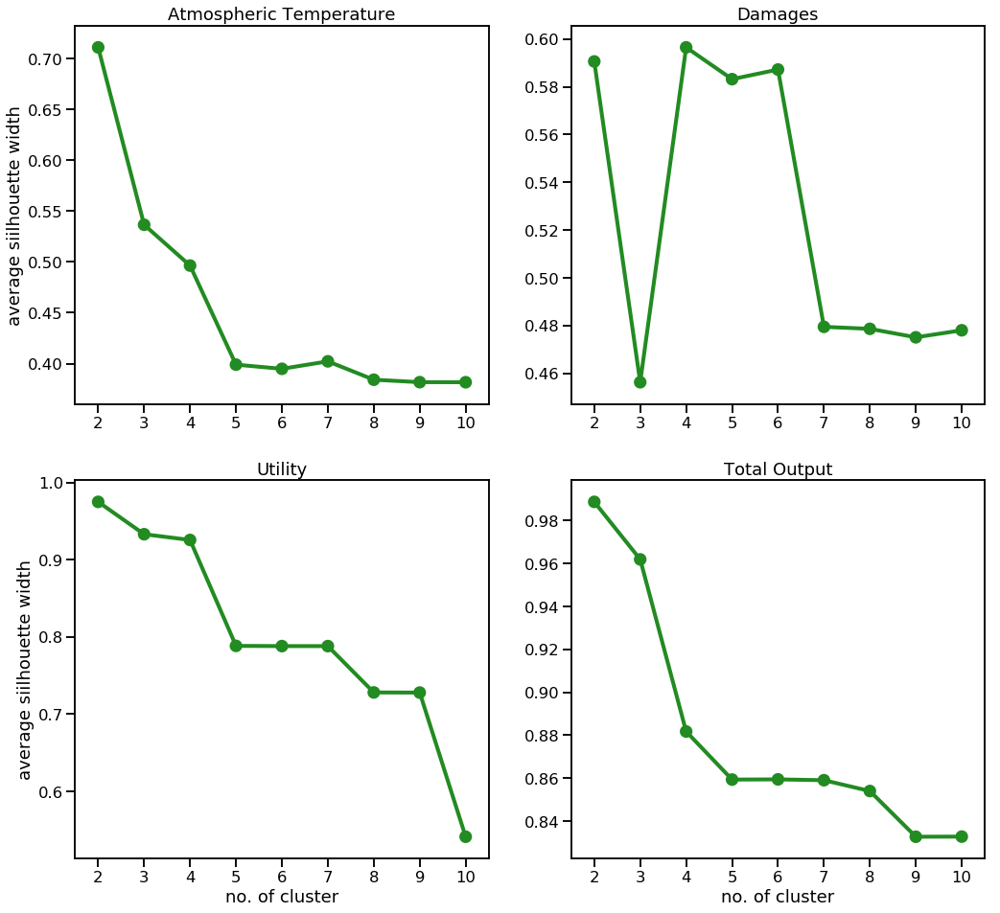

In [11]:
sns.set_context("talk")
fig, axes = plt.subplots(nrows=2, ncols=2, figsize=(17,16))
for i in range (2):
    for j in range (2):
        axes[i,j].set_title(scoresDF.columns[2*i+j+1])
        sns.pointplot(x = scoresDF.columns[0], y = scoresDF.columns[2*i+j+1], data = scoresDF, color = "forestgreen", ax=axes[i,j])
        axes[i,j].set_title(scoresDF.columns[2*i+j+1])        
        axes[0,j].ylim(0,1)
    axes[i,0].set(ylabel='average siilhouette width')
    axes[i,1].set(ylabel='')
plt.show()

fig.savefig("silhouette_width_for_all_outcomes_V4.png", bbox_inches='tight')

## Damages

In [12]:
damages4_DF = pd.read_csv("TSC_30k_Damages_cluster_4.csv")

In [13]:
damages4_DF = damages4_DF.drop(["Unnamed: 0"], axis = 1)

In [14]:
damages4_DF['clusters'] = damages4_DF['clusters'].astype(object)

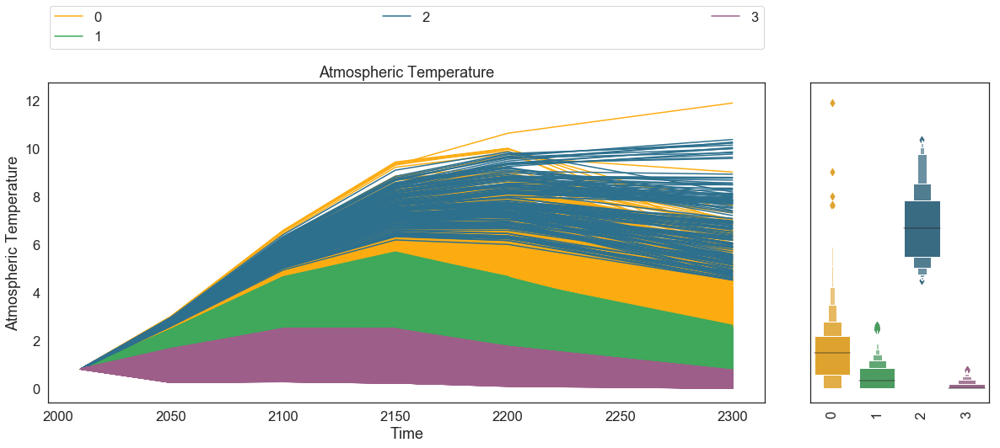

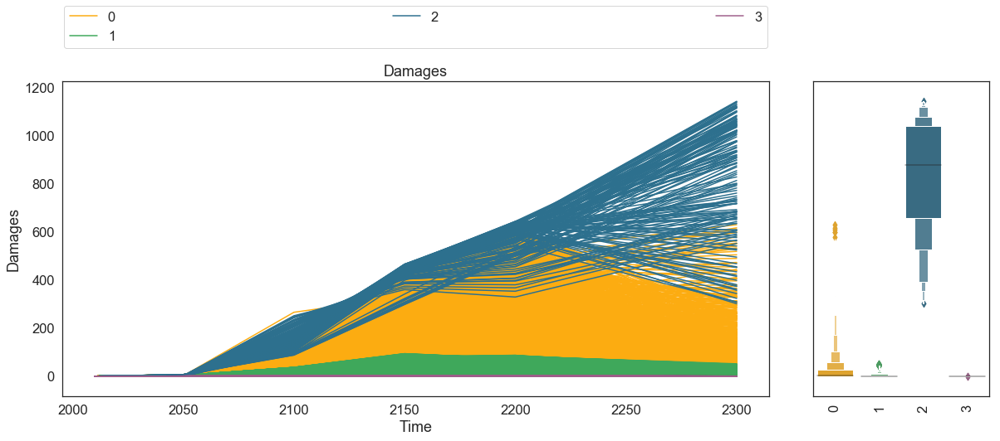

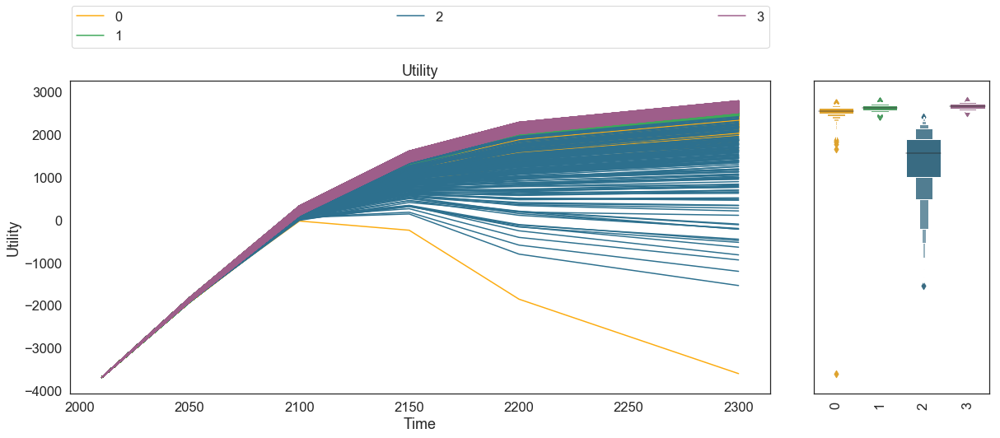

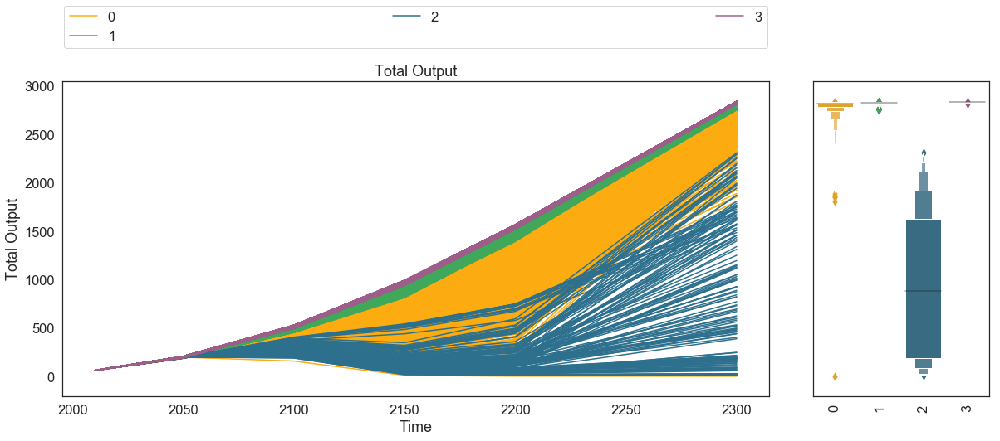

Plot time is 3 mintues


In [15]:
start = time.time()
sns.set(font_scale=1.5, style='white')
for outcome in noutcomes_wo_time.keys():
    fig,axes=plotting.lines(damages4_DF, noutcomes, outcomes_to_show=outcome, 
                            group_by='clusters', density=Density.BOXENPLOT)
    fig.set_size_inches(20, 7)
    fig.savefig("cluster_plot_damages_" + outcome + "_V4.png", bbox_inches='tight')
plt.show()
end = time.time()
print('Plot time is ' + str(round((end - start)/60)) + ' mintues')

### Parallel Coordinates

In [16]:
par_damages4_DF = damages4_DF.iloc[:,[0,1,3,4,5,-1]]

cols = list(par_damages4_DF.columns)
cols[cols.index('t2xco2_dist')], cols[cols.index('cback')] = cols[cols.index('cback')], cols[cols.index('t2xco2_dist')]
par_damages4_DF = par_damages4_DF[cols]
par_damages4_DF.columns = ["ECS Distribution", "Damage Function", "Population Growth Rate", "Init. EOR Growth Rate", "Price of Backstop Technology", "Cluster"]
#par_damages4_DF.style.set_table_styles([dict(selector="th",props=[('max-width', '130px')])])

C:\Users\Shajee\Anaconda3\lib\site-packages\matplotlib\tight_layout.py:198: UserWarning: tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('tight_layout cannot make axes width small enough '


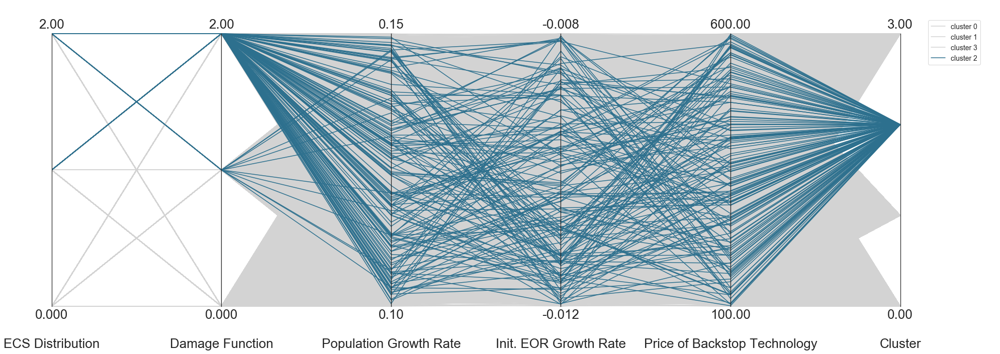

In [17]:
paraxes = parcoords.ParallelAxes(parcoords.get_limits(par_damages4_DF), rot=0)
paraxes.fig.set_size_inches(25,10)
for i in [0,1,3]:
    paraxes.plot(par_damages4_DF.loc[par_damages4_DF.Cluster == i], color="lightgray", label='cluster '+str(i))
for i in [2]:
    paraxes.plot(par_damages4_DF.loc[par_damages4_DF.Cluster == i], color=clr_palette[i], label='cluster '+str(i))
paraxes.legend()
cf.change_fontsize(paraxes, fs=26)
plt.show()

paraxes.fig.savefig("cluster_parallelcord_damages_V4.png", bbox_inches='tight')

In [18]:
len(par_damages4_DF.loc[(par_damages4_DF.Cluster == 2)])

156

### Pairplots

C:\Users\Shajee\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Shajee\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


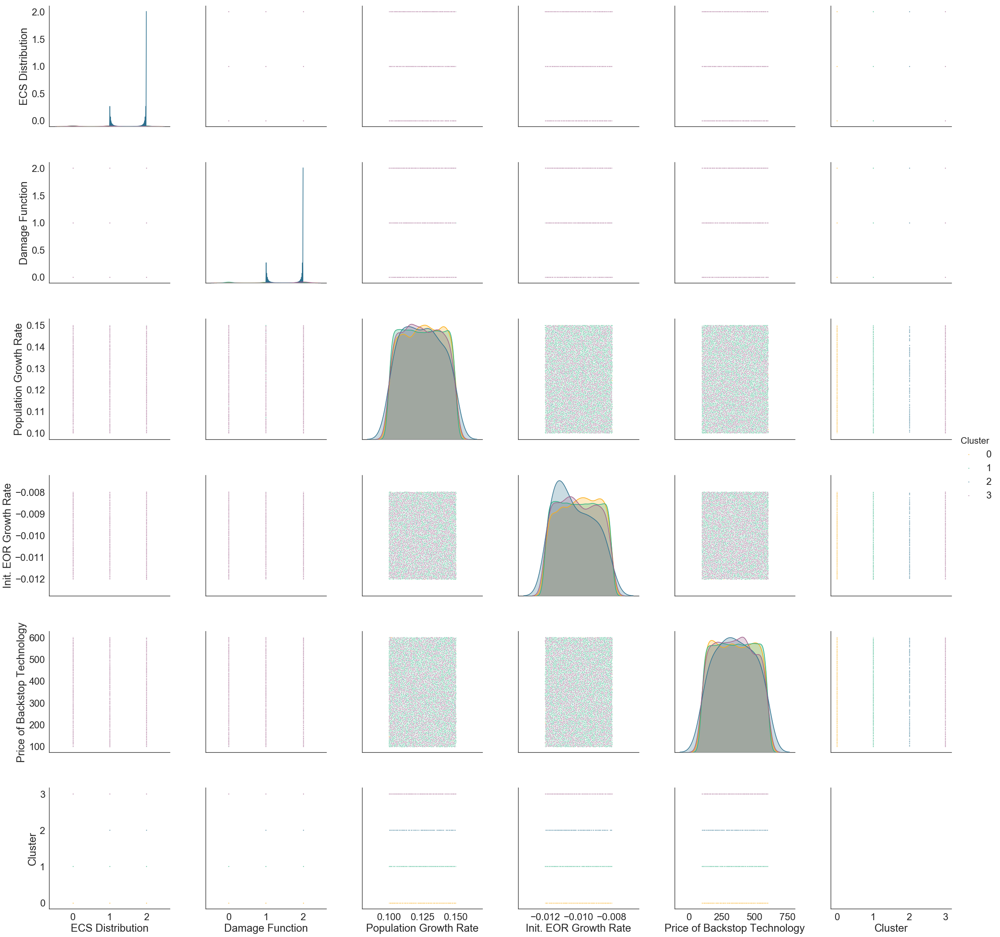

In [19]:
# show the input space
sns.set(font_scale=2, style='white')
pp_dam = sns.pairplot(par_damages4_DF, hue='Cluster', height = 5, palette=clr_palette, 
                      vars = par_damages4_DF.columns, plot_kws=dict(s=7))
plt.show()

pp_dam.fig.savefig("cluster_pairplot_input_damages_V4.png", bbox_inches='tight')

## Atmospheric Temperature

In [20]:
tatm3_DF = pd.read_csv("TSC_30k_Atmospheric Temperature_cluster_3.csv")
tatm3_DF = tatm3_DF.drop(["Unnamed: 0"], axis = 1)
#tatm3_DF.loc[tatm3_DF.clusters == 0, 'clusters'] = 3
#tatm3_DF.clusters = tatm3_DF.clusters - 1

tatm3_DF['clusters'] = tatm3_DF['clusters'].astype(object)

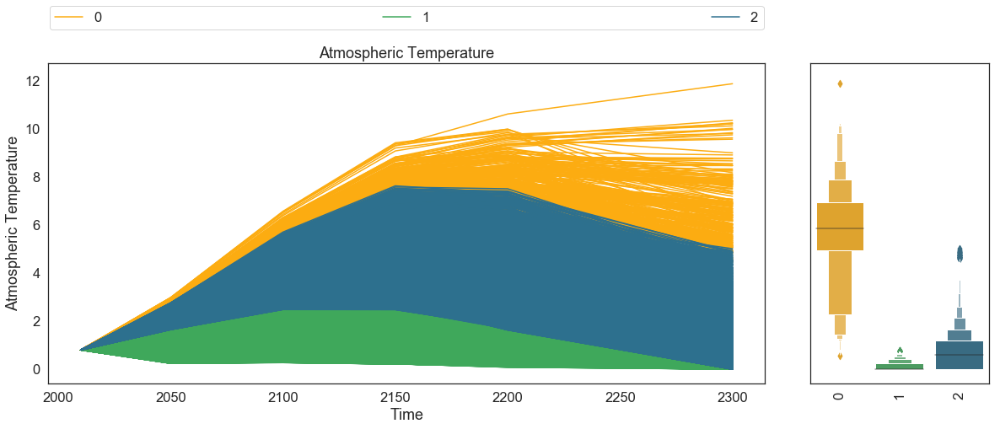

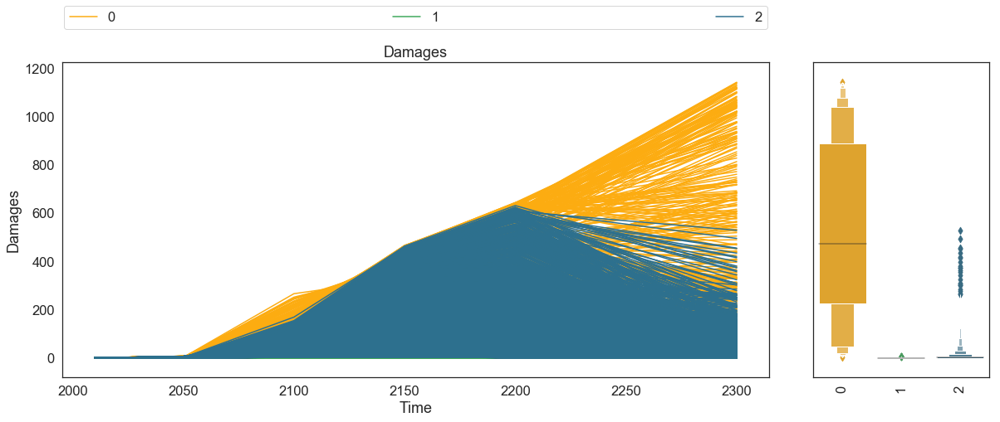

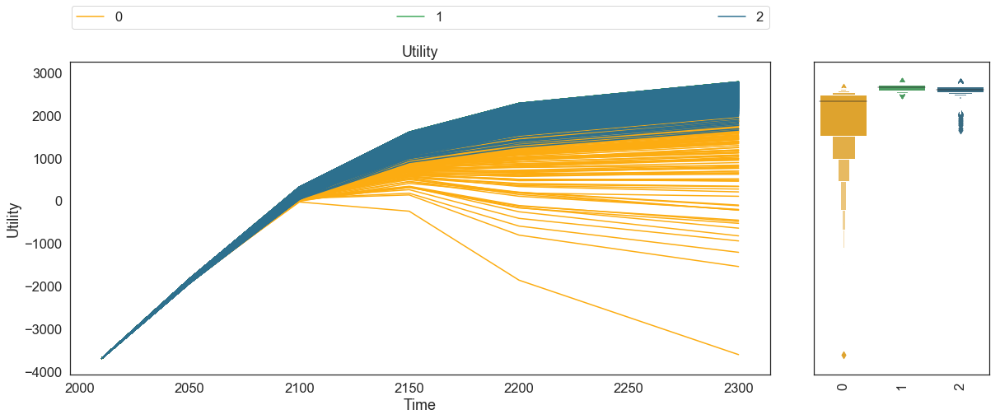

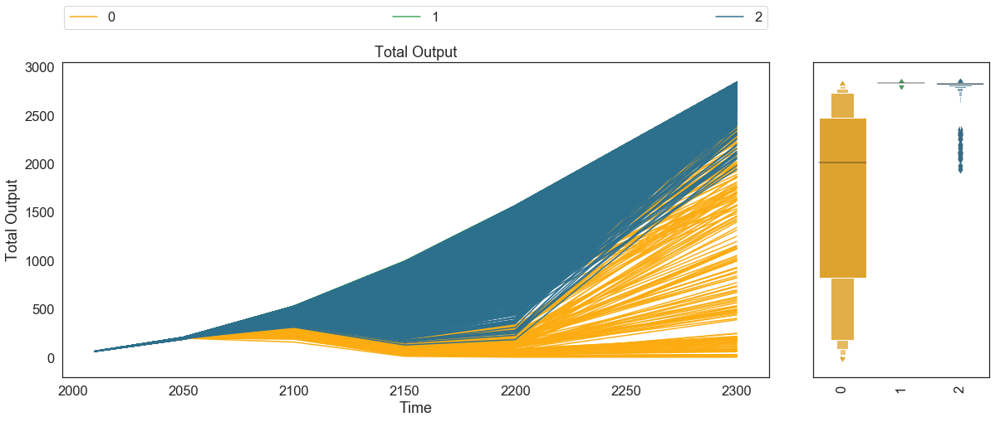

Plot time is 3 mintues


In [21]:
start = time.time()
sns.set(font_scale=1.5, style='white')
for outcome in noutcomes_wo_time.keys():
    fig,axes=plotting.lines(tatm3_DF, noutcomes, outcomes_to_show=outcome, group_by='clusters', density=Density.BOXENPLOT)
    fig.set_size_inches(20, 7)
    fig.savefig("cluster_plot_tatm_" + outcome + "_V4.png", bbox_inches='tight')
plt.show()
end = time.time()
print('Plot time is ' + str(round((end - start)/60)) + ' mintues')

In [22]:
# results = x,outcomes

In [23]:
# file_name = 'TSC_tatm_' + str(n_scenarios) + 'scen_' + 'nordhaus_optimal_policy_' + str(4) + 'obj_clustering_data' + '.tar.gz'
# save_results(results, file_name)
# #results = load_results(file_name)

### Parallel Coordinates

In [24]:
par_tatm3_DF = tatm3_DF.iloc[:,[0,1,3,4,5,-1]]

cols = list(par_tatm3_DF.columns)
#switch columns
cols[cols.index('t2xco2_dist')], cols[cols.index('cback')] = cols[cols.index('cback')], cols[cols.index('t2xco2_dist')]
par_tatm3_DF = par_tatm3_DF[cols]
#rename columns
par_tatm3_DF.columns = ["ECS Distribution", "Damage Function", "Population Growth Rate", "Init. EOR Growth Rate", "Price of Backstop Technology", "Cluster"]

C:\Users\Shajee\Anaconda3\lib\site-packages\matplotlib\tight_layout.py:198: UserWarning: tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('tight_layout cannot make axes width small enough '


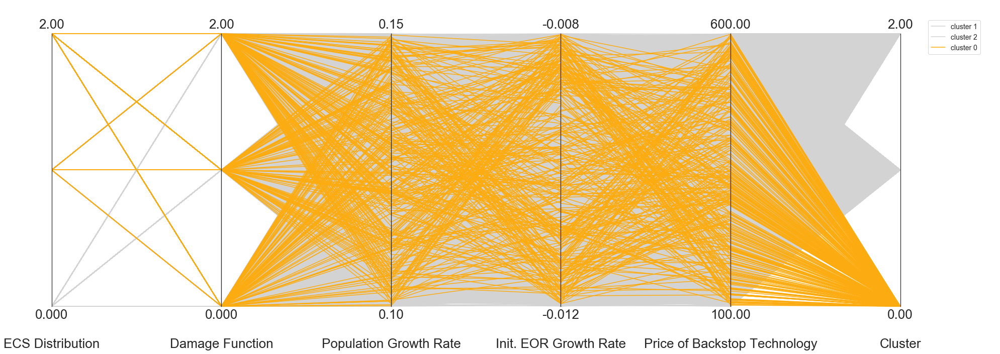

In [25]:
paraxes = parcoords.ParallelAxes(parcoords.get_limits(par_tatm3_DF), rot=0)
paraxes.fig.set_size_inches(25,10)
for i in [1,2]:
    paraxes.plot(par_tatm3_DF.loc[par_tatm3_DF.Cluster == i], color="lightgray", label='cluster '+str(i))
for i in [0]:
    paraxes.plot(par_tatm3_DF.loc[par_tatm3_DF.Cluster == i], color=clr_palette[i], label='cluster '+str(i))
paraxes.legend()
cf.change_fontsize(paraxes, fs=26)
plt.show()

paraxes.fig.savefig("cluster_parallelcord_tatm_V4.png", bbox_inches='tight')

In [26]:
len(par_tatm3_DF.loc[(par_tatm3_DF.Cluster == 0)])

305

### Pairplots

C:\Users\Shajee\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Shajee\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


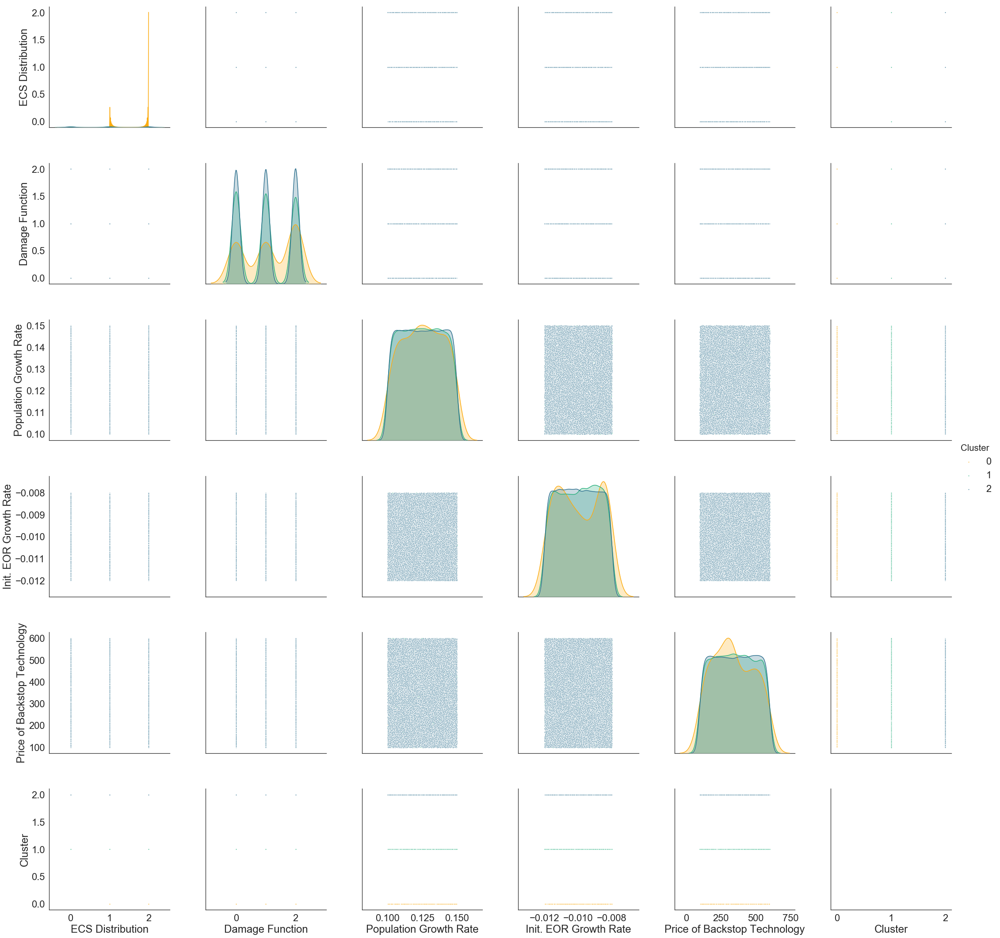

In [27]:
# show the input space
sns.set(font_scale=2, style='white')
pp_tatm = sns.pairplot(par_tatm3_DF, hue='Cluster', height = 5, palette = clr_palette, 
                       vars = par_tatm3_DF.columns, plot_kws=dict(s=7))
plt.show()

pp_tatm.fig.savefig("cluster_pairplot_input_tatm_V4.png", bbox_inches='tight')

## Utility

In [28]:
util3_DF = pd.read_csv("TSC_30k_Utility_cluster_3.csv")

In [29]:
util3_DF = util3_DF.drop(["Unnamed: 0"], axis = 1)

In [30]:
util3_DF['clusters'] = util3_DF['clusters'].astype(object)

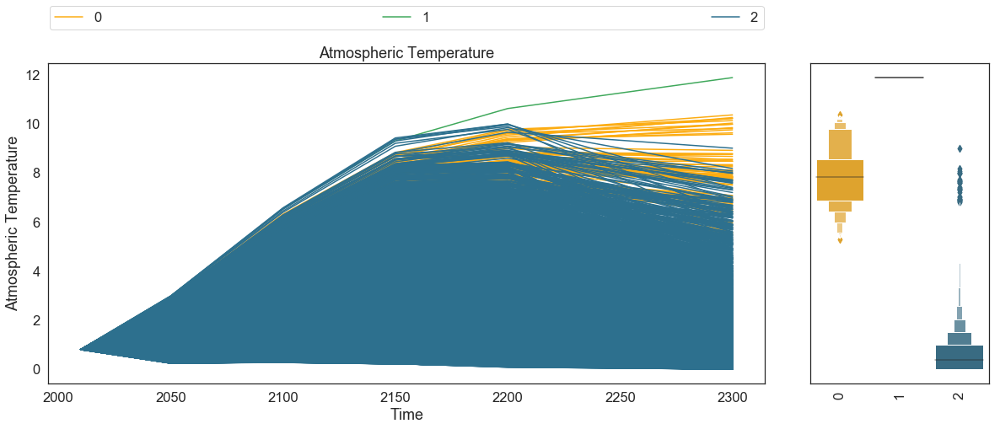

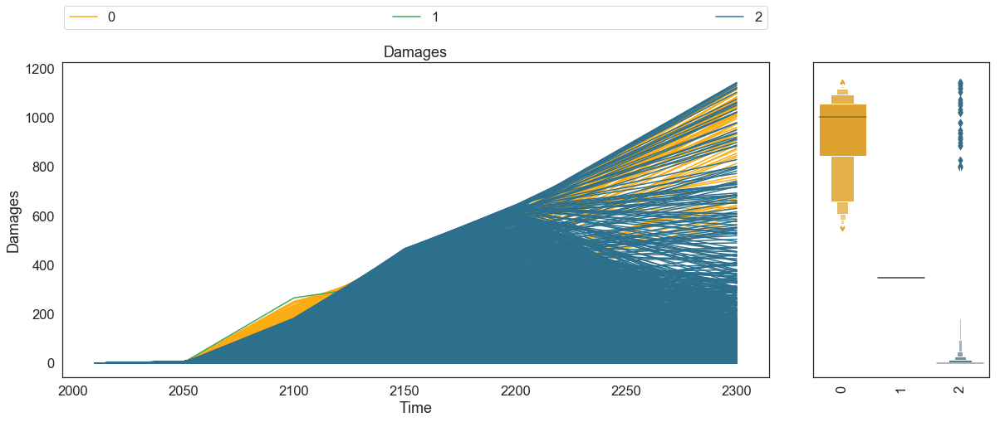

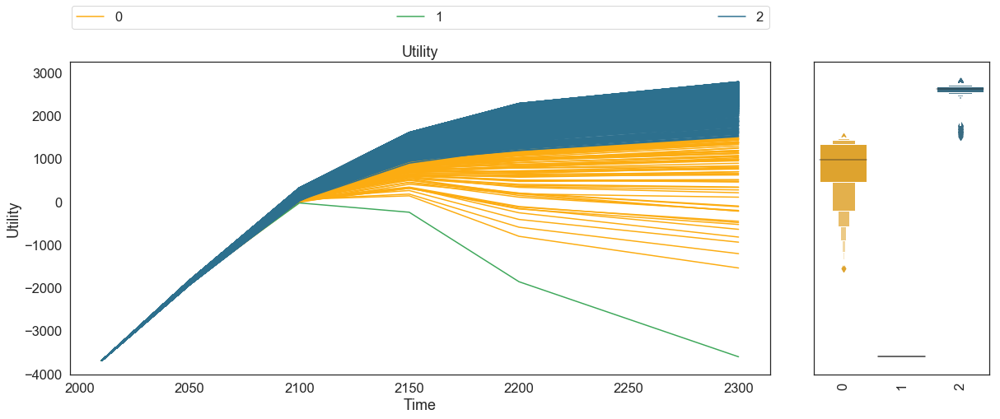

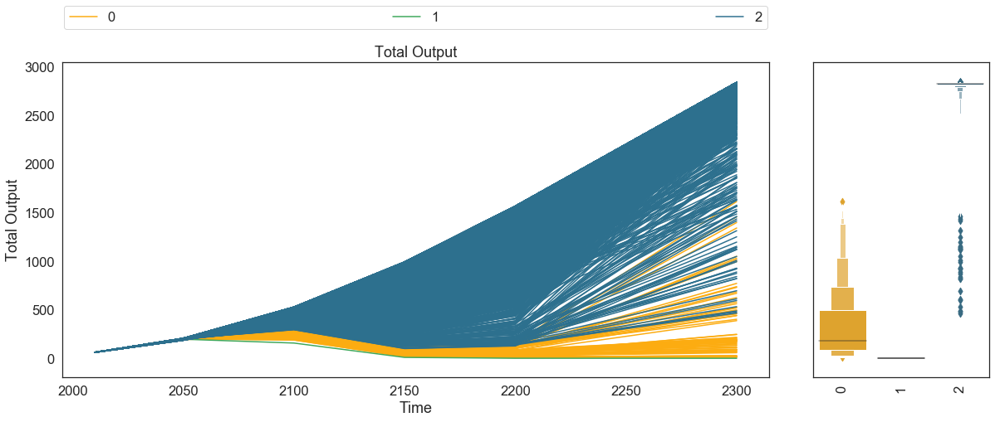

Plot time is 3 mintues


In [31]:
start = time.time()
sns.set(font_scale=1.5, style='white')
for outcome in noutcomes_wo_time.keys():
    fig,axes=plotting.lines(util3_DF, noutcomes, outcomes_to_show=outcome, group_by='clusters', density=Density.BOXENPLOT)
    fig.set_size_inches(20, 7)
    fig.savefig("cluster_plot_util_" + outcome + "_V4.png", bbox_inches='tight')
plt.show()
end = time.time()
print('Plot time is ' + str(round((end - start)/60)) + ' mintues')

In [32]:
#\ results = util10_DF,outcomes

In [33]:
# file_name = 'TSC_utility_' + str(n_scenarios) + 'scen_' + 'nordhaus_optimal_policy_' + str(4) + 'obj_clustering_data' + '.tar.gz'
# save_results(results, file_name)
# #results = load_results(file_name)

### Parallel Coordinates

In [34]:
par_util3_DF = util3_DF.iloc[:,[0,1,3,4,5,-1]]

cols = list(par_util3_DF.columns)
#switch columns
cols[cols.index('t2xco2_dist')], cols[cols.index('cback')] = cols[cols.index('cback')], cols[cols.index('t2xco2_dist')]
par_util3_DF = par_util3_DF[cols]
#rename columns
par_util3_DF.columns = ["ECS Distribution", "Damage Function", "Population Growth Rate", "Init. EOR Growth Rate", "Price of Backstop Technology", "Cluster"]

C:\Users\Shajee\Anaconda3\lib\site-packages\matplotlib\tight_layout.py:198: UserWarning: tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('tight_layout cannot make axes width small enough '


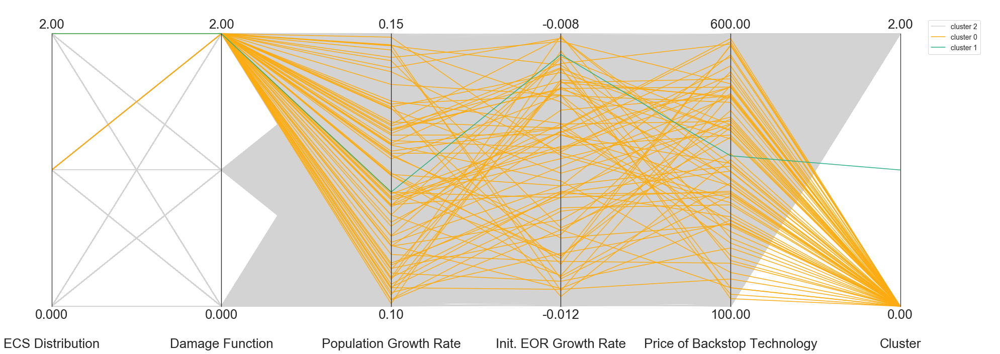

In [35]:
paraxes = parcoords.ParallelAxes(parcoords.get_limits(par_util3_DF), rot=0)
paraxes.fig.set_size_inches(25,10)
for i in [2]:    
    paraxes.plot(par_util3_DF.loc[par_util3_DF.Cluster == i], color="lightgray", label='cluster '+str(i))
for i in [0,1]:
    paraxes.plot(par_util3_DF.loc[par_util3_DF.Cluster == i], color=clr_palette[i], label='cluster '+str(i))
paraxes.legend()
cf.change_fontsize(paraxes, fs=26)
plt.show()

paraxes.fig.savefig("cluster_parallelcord_util_V4.png", bbox_inches='tight')

In [36]:
len(par_util3_DF.loc[(par_util3_DF.Cluster == 1) | (par_util3_DF.Cluster == 0)])

76

### Pairplots

C:\Users\Shajee\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Shajee\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


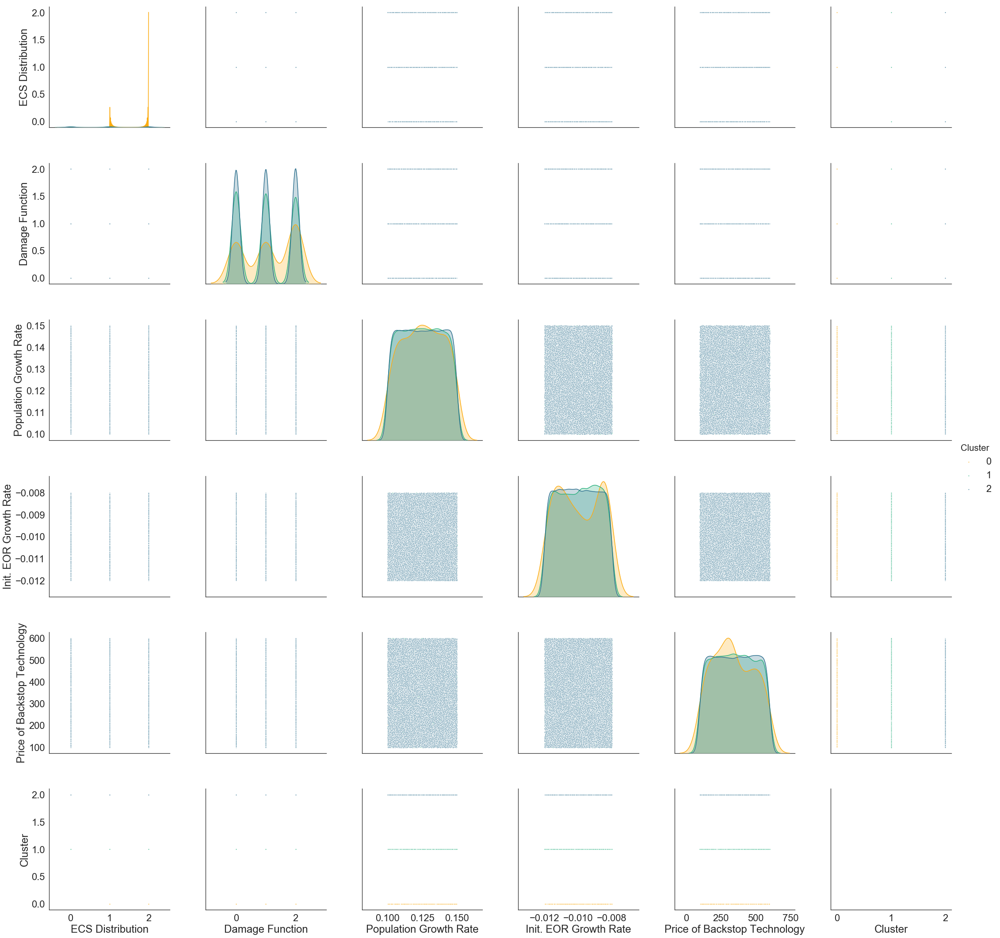

In [37]:
# show the input space
sns.set(font_scale=2, style='white')
pp_util = sns.pairplot(par_tatm3_DF,  hue='Cluster', height = 5, palette = clr_palette,
                       vars = par_tatm3_DF.columns, plot_kws=dict(s=7))
plt.show()

pp_util.fig.savefig("cluster_pairplot_input_util_V4.png", bbox_inches='tight')

## Total Output

In [38]:
to4_DF = pd.read_csv("TSC_30k_Total Output_cluster_4.csv")
to4_DF = to4_DF.drop(["Unnamed: 0"], axis = 1)
to4_DF.loc[to4_DF.clusters == 0, 'clusters'] = 4
to4_DF.clusters = to4_DF.clusters - 1

to4_DF['clusters'] = to4_DF['clusters'].astype(object)

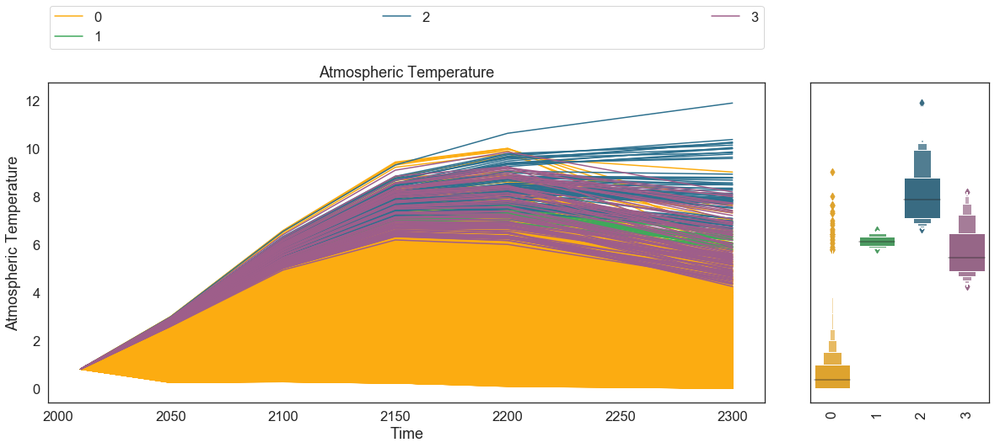

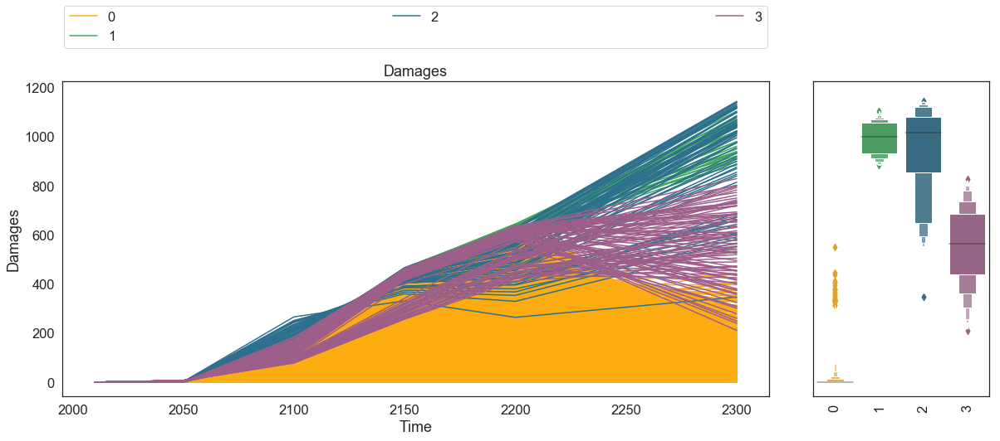

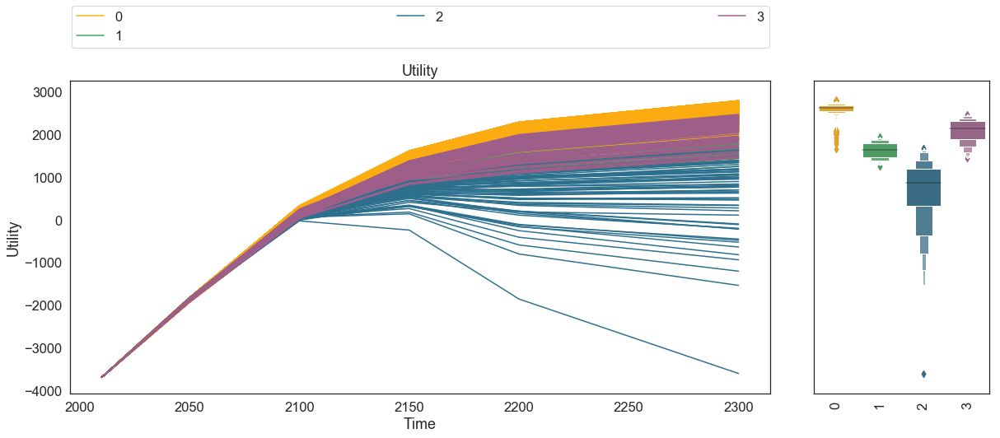

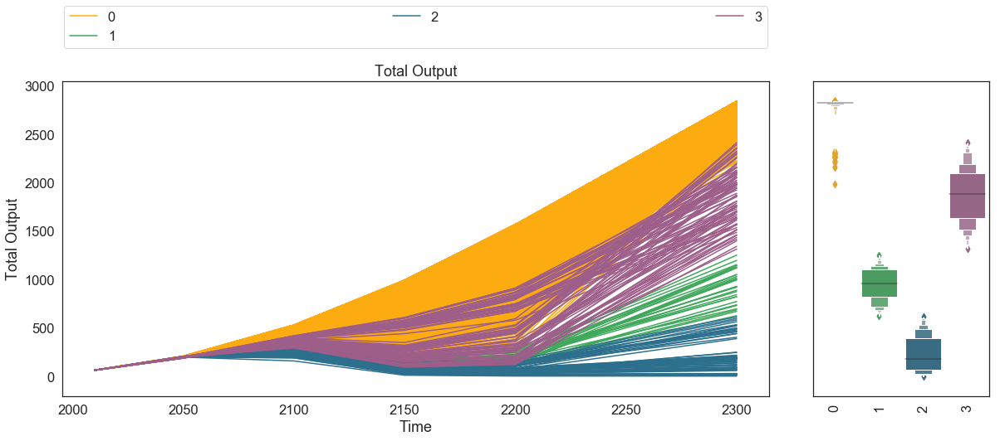

Plot time is 3 mintues


In [39]:
start = time.time()
sns.set(font_scale=1.5, style='white')
for outcome in noutcomes_wo_time.keys():
    fig,axes=plotting.lines(to4_DF, noutcomes, outcomes_to_show=outcome, group_by='clusters', density=Density.BOXENPLOT)
    fig.set_size_inches(20, 7)
    fig.savefig("cluster_plot_to_" + outcome + "_V4.png", bbox_inches='tight')
plt.show()
end = time.time()
print('Plot time is ' + str(round((end - start)/60)) + ' mintues')

In [40]:
# results = x,outcomes

In [41]:
# file_name = 'TSC_total_output' + str(n_scenarios) + 'scen_' + 'nordhaus_optimal_policy_' + str(4) + 'obj_clustering_data' + '.tar.gz'
# save_results(results, file_name)
# # results = load_results(file_name)

### Parallel Coordinates

In [42]:
par_to4_DF = to4_DF.iloc[:,[0,1,3,4,5,-1]]

cols = list(par_to4_DF.columns)
#switch columns
cols[cols.index('t2xco2_dist')], cols[cols.index('cback')] = cols[cols.index('cback')], cols[cols.index('t2xco2_dist')]
par_to4_DF = par_to4_DF[cols]
#rename columns
par_to4_DF.columns = ["ECS Distribution", "Damage Function", "Population Growth Rate", "Init. EOR Growth Rate", "Price of Backstop Technology", "Cluster"]

C:\Users\Shajee\Anaconda3\lib\site-packages\matplotlib\tight_layout.py:198: UserWarning: tight_layout cannot make axes width small enough to accommodate all axes decorations
  warnings.warn('tight_layout cannot make axes width small enough '


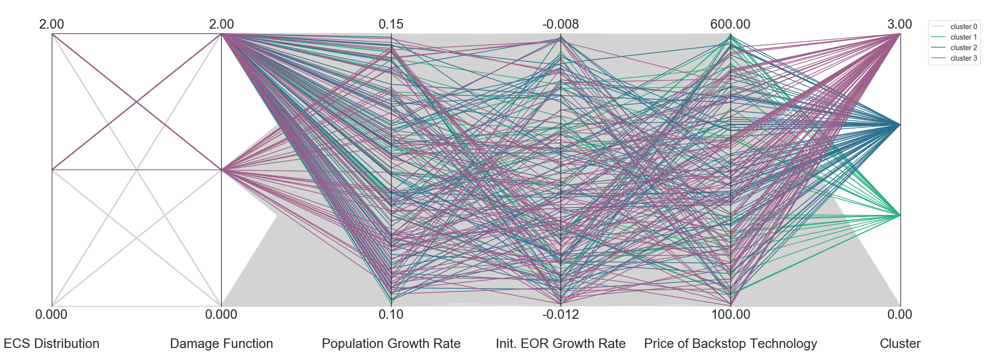

In [43]:
paraxes = parcoords.ParallelAxes(parcoords.get_limits(par_to4_DF), rot=0)
paraxes.fig.set_size_inches(25,10)
for i in [0]:
    paraxes.plot(par_to4_DF.loc[par_to4_DF.Cluster == i], color="lightgray", label='cluster '+str(i))
for i in [1,2,3]:
    paraxes.plot(par_to4_DF.loc[par_to4_DF.Cluster == i], color=clr_palette[i], label='cluster '+str(i))
paraxes.legend()
cf.change_fontsize(paraxes, fs=26)
plt.show()

paraxes.fig.savefig("cluster_parallelcord_to_V4.png", bbox_inches='tight')

In [44]:
len(par_to4_DF.loc[(par_to4_DF.Cluster == 1) | (par_to4_DF.Cluster == 2) | (par_to4_DF.Cluster == 3)])

184

### Pairplots

C:\Users\Shajee\Anaconda3\lib\site-packages\scipy\stats\stats.py:1713: FutureWarning: Using a non-tuple sequence for multidimensional indexing is deprecated; use `arr[tuple(seq)]` instead of `arr[seq]`. In the future this will be interpreted as an array index, `arr[np.array(seq)]`, which will result either in an error or a different result.
  return np.add.reduce(sorted[indexer] * weights, axis=axis) / sumval
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kde.py:488: RuntimeWarning: invalid value encountered in true_divide
  binned = fast_linbin(X, a, b, gridsize) / (delta * nobs)
C:\Users\Shajee\Anaconda3\lib\site-packages\statsmodels\nonparametric\kdetools.py:34: RuntimeWarning: invalid value encountered in double_scalars
  FAC1 = 2*(np.pi*bw/RANGE)**2
C:\Users\Shajee\Anaconda3\lib\site-packages\numpy\core\fromnumeric.py:83: RuntimeWarning: invalid value encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)


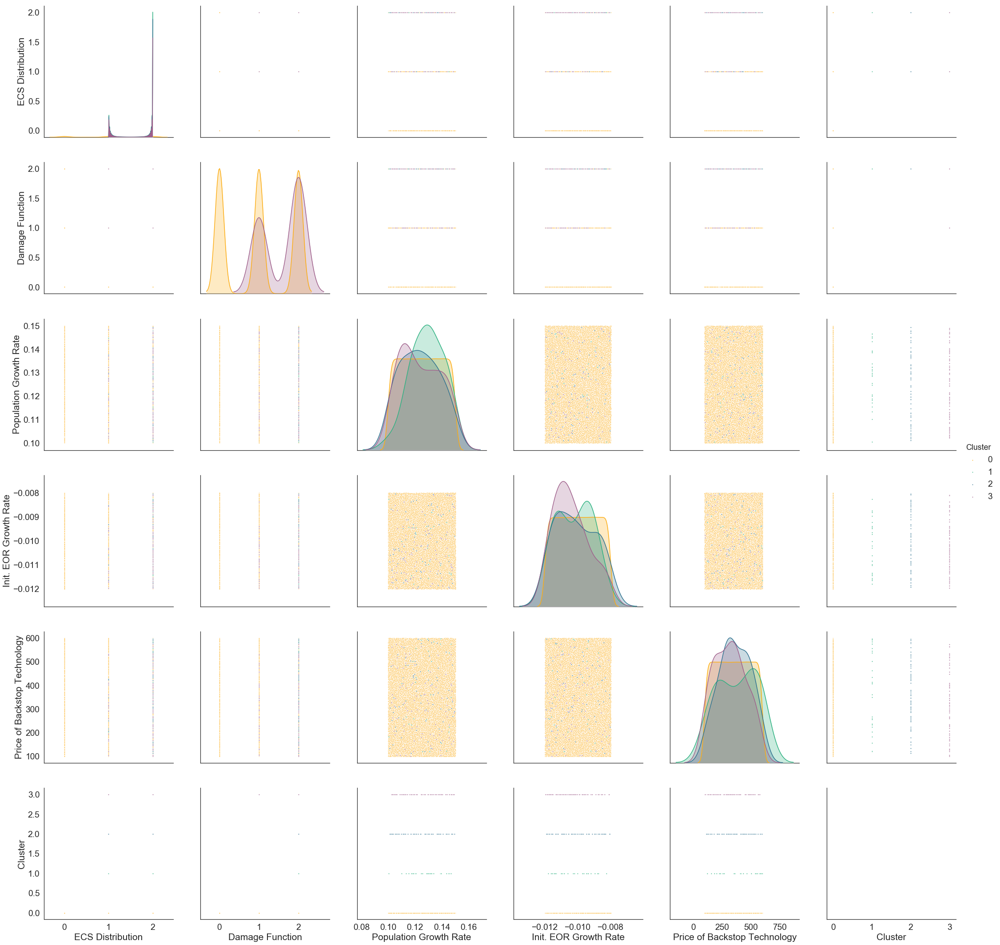

In [45]:
# show the input space
sns.set(font_scale=1.75, style='white')
pp_to = sns.pairplot(par_to4_DF, hue='Cluster', height = 5, palette = clr_palette, 
                     vars = par_to4_DF.columns, plot_kws=dict(s=7))
plt.show()

pp_to.fig.savefig("cluster_pairplot_input_to_V4.png", bbox_inches='tight')

## Merge all worse-off scnearios

In [46]:
toDF = to4_DF[to4_DF["clusters"] != 0]
damDF  = damages4_DF[damages4_DF["clusters"] == 2]
utilDF = util3_DF[util3_DF["clusters"] != 2]
tatmDF = tatm3_DF[tatm3_DF["clusters"] == 0]

In [47]:
damDF  = damDF.drop(damDF.columns[-1], axis = 1)
toDF   = toDF.drop(toDF.columns[-1], axis = 1)
utilDF = utilDF.drop(utilDF.columns[-1], axis = 1)
tatmDF = tatmDF.drop(tatmDF.columns[-1], axis = 1)

In [48]:
# finding the wcs scnearios by retrieving the index
wcs_tsc_DF = pd.concat([toDF,utilDF,tatmDF, damDF], axis = 0)

wcs_tsc_DF = wcs_tsc_DF.drop_duplicates()

wcs_tcs_index = wcs_tsc_DF.index

In [49]:
wcs_tcs_index

Int64Index([   36,    82,    91,   345,   637,   776,   834,  1109,  1166,
             1236,
            ...
            26426, 26506, 27035, 27797, 27840, 28076, 28173, 29110, 29658,
            29721],
           dtype='int64', length=328)

In [50]:
wcs_tcs_index = wcs_tsc_DF.index

resDF = pd.concat([experiments,pd.DataFrame.from_dict(outcomes)], axis = 1)

In [51]:
wcs_resDF = resDF.iloc[wcs_tcs_index,:]

In [52]:
wcs_resDF = wcs_resDF.reset_index(drop=True)

In [53]:
wcs_resDF.to_csv("wcs_tsc_results_V4.csv")

## Merge only worse-off scenarios of utility 

In [54]:
utilDF_index = utilDF.index

In [55]:
resDF = pd.concat([experiments,pd.DataFrame.from_dict(outcomes)], axis = 1)

In [56]:
wcs_util_resDF = resDF.iloc[utilDF_index,:]
wcs_util_resDF = wcs_util_resDF.reset_index(drop=True)
wcs_util_resDF.to_csv(policy_folder + "\\wcs_tsc_results_only_util_V4.csv")